<a href="https://colab.research.google.com/github/JaskarJeyabalan/Telco_Customer_Churn_Dataset/blob/main/Main_Notebook/Restaurant_Dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Level 1: Data Exploration & Descriptive Analysis

Task 1: Data Exploration and Preprocessing

In [1]:
import numpy as np
import pandas as pd

path = '/content/Dataset .csv'
df = pd.read_csv(path)
print("Total Restaurant: ", len(df))
print("Toatal Rows & Columns: ", df.shape)
df.head(5)

Total Restaurant:  9551
Toatal Rows & Columns:  (9551, 21)


,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


In [2]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int64  
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9542 non-null   object 
 10  Average Cost for two  9551 non-null   int64  
 11  Currency              9551 non-null   object 
 12  Has Table booking     9551 non-null   object 
 13  Has Online delivery   9551 non-null   object 
 14  Is delivering now     9551 non-null   object 
 15  Switch to order menu 

In [3]:
df.describe()

,Restaurant ID,Country Code,Longitude,Latitude,Average Cost for two,Price range,Aggregate rating,Votes
count,9.551000e+03,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000
mean,9.051128e+06,18.365616,64.126574,25.854381,1199.210763,1.804837,2.666370,156.909748
std,8.791521e+06,56.750546,41.467058,11.007935,16121.183073,0.905609,1.516378,430.169145
min,5.300000e+01,1.000000,-157.948486,-41.330428,0.000000,1.000000,0.000000,0.000000
25%,3.019625e+05,1.000000,77.081343,28.478713,250.000000,1.000000,2.500000,5.000000
50%,6.004089e+06,1.000000,77.191964,28.570469,400.000000,2.000000,3.200000,31.000000
75%,1.835229e+07,1.000000,77.282006,28.642758,700.000000,2.000000,3.700000,131.000000
max,1.850065e+07,216.000000,174.832089,55.976980,800000.000000,4.000000,4.900000,10934.000000


In [4]:
df.dtypes

,0
Restaurant ID,int64
Restaurant Name,object
Country Code,int64
City,object
Address,object
Locality,object
Locality Verbose,object
Longitude,float64
Latitude,float64
Cuisines,object


Data Cleaning

In [5]:
df.isnull().sum()

,0
Restaurant ID,0
Restaurant Name,0
Country Code,0
City,0
Address,0
Locality,0
Locality Verbose,0
Longitude,0
Latitude,0
Cuisines,9


In [6]:
# Clean Columns
def clean_dataframe(df):
  def clean_column(col):
    if col.dtype == 'object':
      # Strip whitespace and replace empty strings with NaN
      return col.str.strip().replace('', np.nan)
    elif pd.api.types.is_numeric_dtype(col):
      # Replace infinite values with NaN
      return col.replace([np.inf, -np.inf], np.nan)
    else:
      return col  # Leave other types untouched (e.g., datetime, bool)

  return df.apply(clean_column)
df = clean_dataframe(df)

Check Duplication

In [7]:
df[df.duplicated()]

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes


In [8]:
df.drop_duplicates(inplace=True)

In [9]:
df.isnull().sum()

,0
Restaurant ID,0
Restaurant Name,0
Country Code,0
City,0
Address,0
Locality,0
Locality Verbose,0
Longitude,0
Latitude,0
Cuisines,9


In [10]:
df['Cuisines'].isnull().sum()

np.int64(9)

In [11]:
missing_cuisines = df[df['Cuisines'].isna()]
print(missing_cuisines[['Restaurant ID', 'Cuisines']])

     Restaurant ID Cuisines
84        17284105      NaN
87        17284211      NaN
94        17284158      NaN
297       17374552      NaN
328       17501439      NaN
346       17606621      NaN
368       17059060      NaN
418       17142698      NaN
455       17616465      NaN


In [12]:
df['Cuisines'] = df.groupby('Locality')['Cuisines'].transform(
    lambda x: x.fillna(x.mode()[0] if not x.mode().empty else 'Unknown')
)
print("Missing after fill:", df['Cuisines'].sum())

Missing after fill: French, Japanese, DessertsJapaneseSeafood, Asian, Filipino, IndianJapanese, SushiJapanese, KoreanChineseAsian, EuropeanSeafood, Filipino, Asian, EuropeanEuropean, Asian, IndianFilipinoFilipino, MexicanAmerican, Ice Cream, DessertsFilipino, MexicanFilipinoKoreanCafe, American, Italian, FilipinoItalian, PizzaFilipinoCafe, Korean, DessertsCafe, Bakery, American, ItalianSeafood, American, Mediterranean, JapaneseAmerican, Asian, Italian, SeafoodFast Food, FrenchCafeBakeryBrazilianPizzaJapaneseArabianJapaneseBrazilian, CafeItalianPizzaBar Food, BrazilianMexican, GrillInternationalPeruvian, Latin AmericanAmerican, GrillSeafoodInternationalItalianAmerican, BurgerSeafood, Bar Food, BrazilianDesserts, CafeJuices, Healthy FoodBeverages, Bar Food, Fast FoodLebaneseBurgerBrazilian, Bar FoodBrazilian, Healthy Food, Juices, PizzaBrazilian, Bar FoodBrazilianBrazilianItalianJapaneseBakery, Sandwich, BrazilianBrazilianBrazilian, SeafoodBar Food, BrazilianBrazilianBrazilian, Bar FoodB

In [13]:
df['Cuisines'].isnull().sum()

np.int64(0)

In [14]:
top_cuisines = df.groupby('Locality')['Cuisines'].agg(lambda x: x.mode()[0])
print(top_cuisines.head(10))

Locality
12th Square Building, Banjara Hills                                   Mughlai, North Indian, Chinese
A Hotel, Gurdev Nagar                                               North Indian, Chinese, Fast Food
ARSS Mall, Paschim Vihar                           North Indian, South Indian, Chinese, Mithai, F...
Aaya Nagar                                                                            Cuisine Varies
Abu Dhabi Mall, Tourist Club Area  (Al Zahiyah)                                             American
Abu Shagara                                                   Indian, Mughlai, South Indian, Biryani
Acropolis Mall, Kasba                                                                 Asian, Chinese
Adajan Gam                                                   Chinese, North Indian, Italian, Mexican
Adchini                                                                                    Fast Food
Addition Hills                                                                    

Exploratory Data Analysis (EDA)

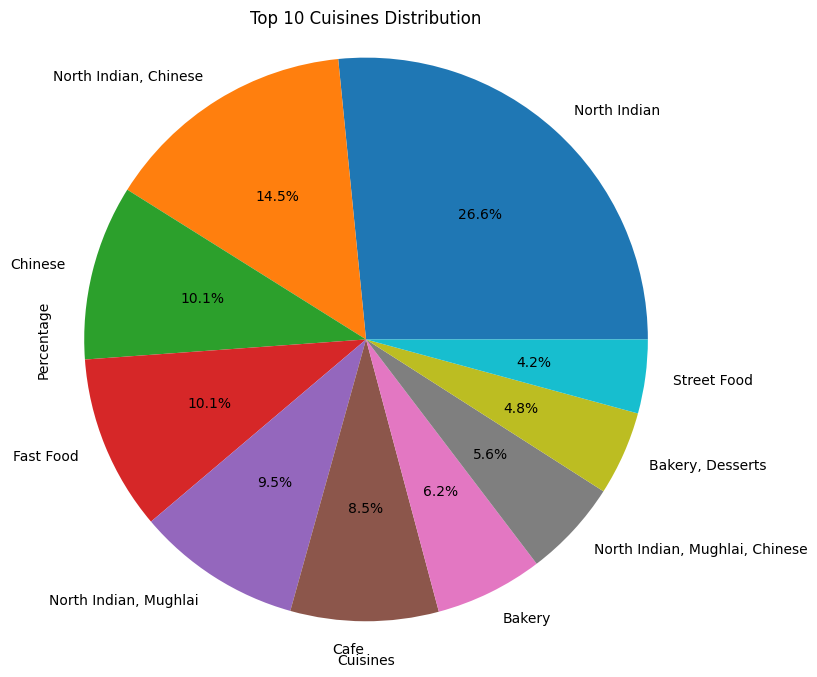

In [15]:
import seaborn as sns
import matplotlib.pyplot as plt

# Count top 10 cuisines
top_cuisines = df['Cuisines'].value_counts().head(10)

# Plot pie chart
plt.figure(figsize=(8, 8))
plt.pie(top_cuisines.values, labels=top_cuisines.index, autopct='%1.1f%%')
plt.title('Top 10 Cuisines Distribution')
plt.xlabel('Cuisines')
plt.ylabel('Percentage')
plt.axis('equal')
plt.savefig('Cuisines_Distribution.png')
plt.show()


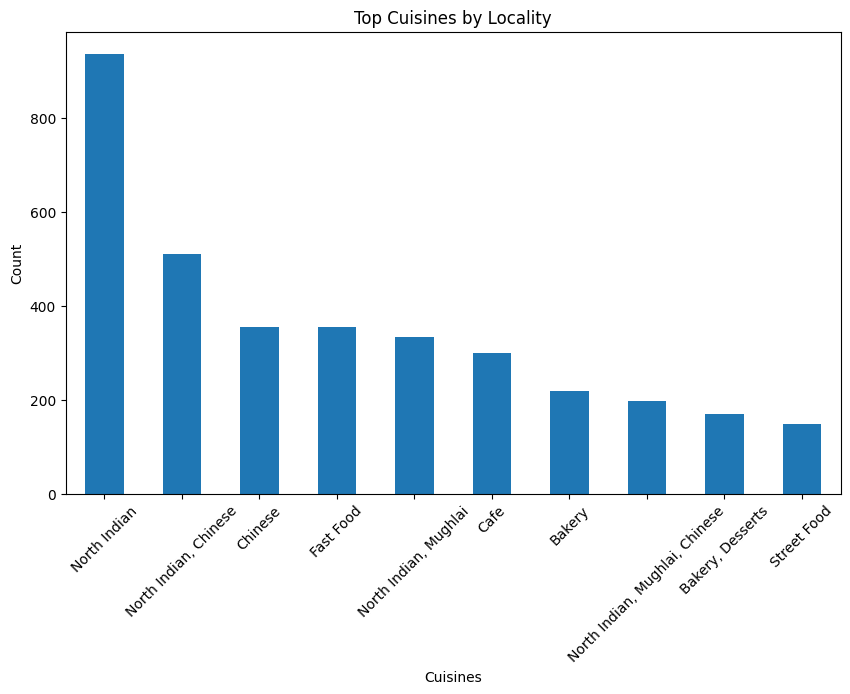

In [16]:
top_cuisines.plot(kind='bar', figsize=(10, 6))
plt.title('Top Cuisines by Locality')
plt.xlabel('Cuisines')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.savefig('Top_Cuisines_by_Locality.png')
plt.show()

In [17]:
# Check data types
print("Data types:\n ", df.dtypes)

Data types:
  Restaurant ID             int64
Restaurant Name          object
Country Code              int64
City                     object
Address                  object
Locality                 object
Locality Verbose         object
Longitude               float64
Latitude                float64
Cuisines                 object
Average Cost for two      int64
Currency                 object
Has Table booking        object
Has Online delivery      object
Is delivering now        object
Switch to order menu     object
Price range               int64
Aggregate rating        float64
Rating color             object
Rating text              object
Votes                     int64
dtype: object


Data Conversion

In [18]:
# Convert 'Average Cost for two' int into float
df['Average Cost for two'] = df['Average Cost for two'].astype(float)

Analyze Target Variable

In [19]:
# Summary Statistics
print("Summary Statistics:\n", df['Aggregate rating'].describe())

# Value Count
print("Rating distribution:\n", df['Aggregate rating'].value_counts().sort_index())

Summary Statistics:
 count    9551.000000
mean        2.666370
std         1.516378
min         0.000000
25%         2.500000
50%         3.200000
75%         3.700000
max         4.900000
Name: Aggregate rating, dtype: float64
Rating distribution:
 Aggregate rating
0.0    2148
1.8       1
1.9       2
2.0       7
2.1      15
2.2      27
2.3      47
2.4      87
2.5     110
2.6     191
2.7     250
2.8     315
2.9     381
3.0     468
3.1     519
3.2     522
3.3     483
3.4     498
3.5     480
3.6     458
3.7     427
3.8     400
3.9     335
4.0     266
4.1     274
4.2     221
4.3     174
4.4     144
4.5      95
4.6      78
4.7      42
4.8      25
4.9      61
Name: count, dtype: int64


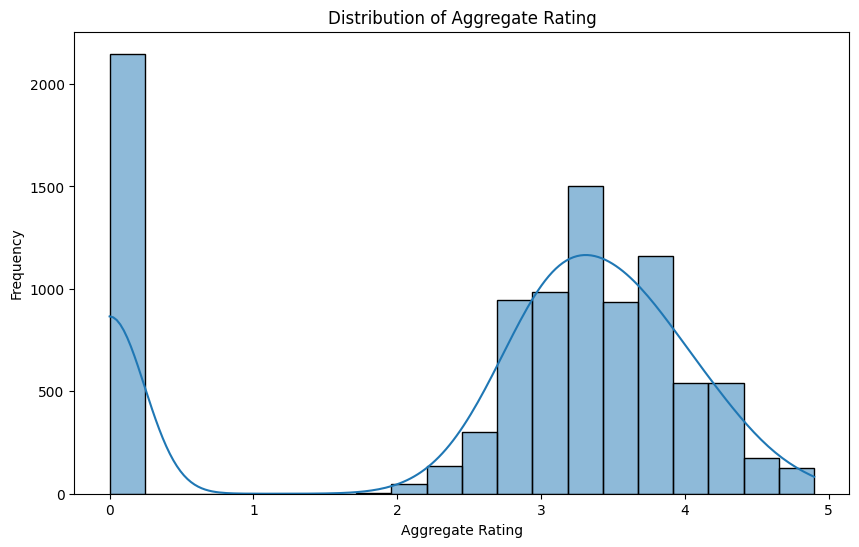

In [20]:
plt.figure(figsize=(10, 6))
sns.histplot(df['Aggregate rating'], bins=20, kde=True)
plt.title('Distribution of Aggregate Rating')
plt.xlabel('Aggregate Rating')
plt.ylabel('Frequency')
plt.savefig('Aggregate_Rating_Distribution.png')
plt.show()

Class Imbalance Check

Class Balance:
 Rating Category
Average      3737
Good         3179
Poor         2334
Excellent     301
Name: count, dtype: int64


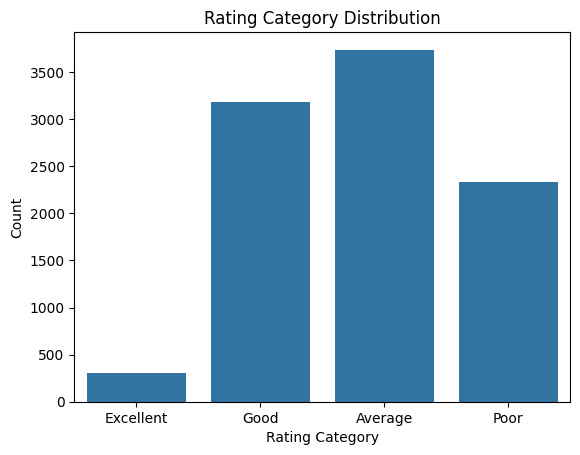

In [21]:
# Convert Rating to Categories
def rating_category(rating):
    if rating >= 4.5:
        return 'Excellent'
    elif rating >= 3.5:
        return 'Good'
    elif rating >= 2.5:
        return 'Average'
    else:
        return 'Poor'

df['Rating Category'] = df['Aggregate rating'].apply(rating_category)

# Check class balance
class_balance = df['Rating Category'].value_counts()
print("Class Balance:\n", class_balance)

class_balance.to_excel('Class_Balance.xlsx')

sns.countplot(x='Rating Category', data=df)
plt.title('Rating Category Distribution')
plt.xlabel('Rating Category')
plt.ylabel('Count')
plt.savefig('Rating_Category_Distribution.png')
plt.show()

Task 2: Descriptive Analysis

Basic Statistical Measures for Numerical Columns

In [22]:
# Basic statistics
numerical_cols = ['Average Cost for two', 'Price range', 'Aggregate rating', 'Votes']
stats = df[numerical_cols].describe().T
print("Basic Statistics:\n", stats)

stats.to_excel('Basic_Statistics.xlsx')


Basic Statistics:
                        count         mean           std  min    25%    50%  \
Average Cost for two  9551.0  1199.210763  16121.183073  0.0  250.0  400.0   
Price range           9551.0     1.804837      0.905609  1.0    1.0    2.0   
Aggregate rating      9551.0     2.666370      1.516378  0.0    2.5    3.2   
Votes                 9551.0   156.909748    430.169145  0.0    5.0   31.0   

                        75%       max  
Average Cost for two  700.0  800000.0  
Price range             2.0       4.0  
Aggregate rating        3.7       4.9  
Votes                 131.0   10934.0  


Numerical Statistics

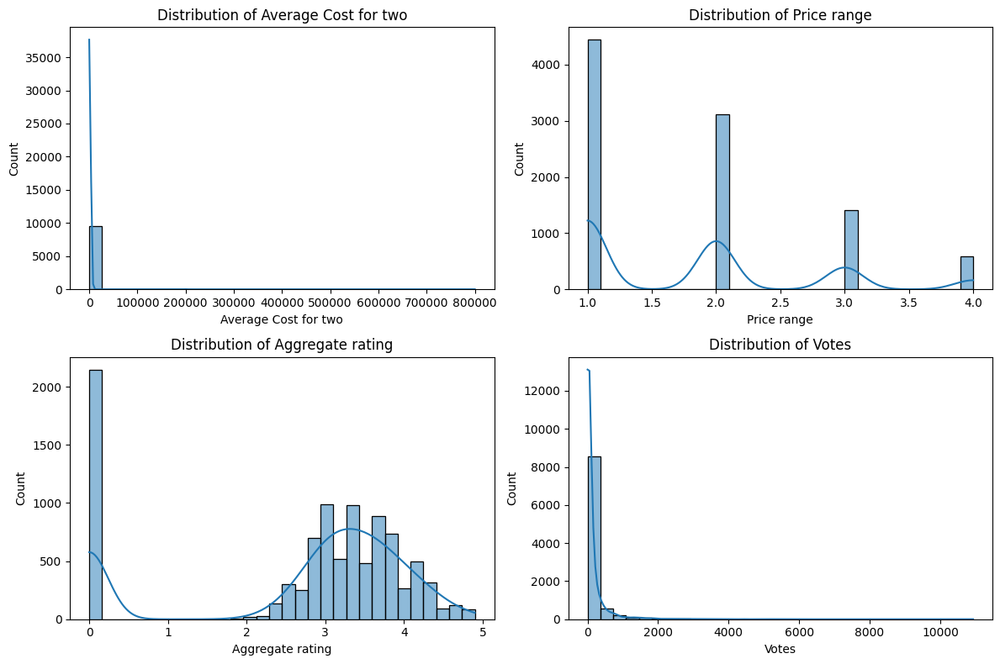

In [23]:
# Histograms
plt.figure(figsize=(12, 8))
for i, col in enumerate(numerical_cols):
    plt.subplot(2, 2, i+1)
    sns.histplot(df[col], kde=True, bins=30)
    plt.title(f'Distribution of {col}')
plt.tight_layout()
plt.savefig('Numerical_Distributions.png')
plt.show()

Map Country Codes and Explore Categorical Distributions

In [24]:
# Map country codes
country_map = {
    1: 'India', 14: 'Australia', 30: 'Brazil', 37: 'Canada',
    94: 'Indonesia', 148: 'New Zealand', 162: 'Philippines',
    166: 'Qatar', 184: 'Singapore', 189: 'South Africa',
    191: 'Sri Lanka', 208: 'Turkey', 214: 'UAE',
    215: 'United Kingdom', 216: 'United States'
}
df['Country'] = df['Country Code'].map(country_map)

# Categorical distributions
print("Country Distribution:\n", df['Country'].value_counts())
print("City Distribution:\n", df['City'].value_counts().head(10))
print("Cuisine Distribution:\n", df['Cuisines'].value_counts().head(10))


Country Distribution:
 Country
India             8652
United States      434
United Kingdom      80
Brazil              60
South Africa        60
UAE                 60
New Zealand         40
Turkey              34
Australia           24
Philippines         22
Indonesia           21
Qatar               20
Singapore           20
Sri Lanka           20
Canada               4
Name: count, dtype: int64
City Distribution:
 City
New Delhi       5473
Gurgaon         1118
Noida           1080
Faridabad        251
Ghaziabad         25
Bhubaneshwar      21
Lucknow           21
Ahmedabad         21
Amritsar          21
Guwahati          21
Name: count, dtype: int64
Cuisine Distribution:
 Cuisines
North Indian                      936
North Indian, Chinese             511
Chinese                           354
Fast Food                         354
North Indian, Mughlai             334
Cafe                              299
Bakery                            218
North Indian, Mughlai, Chinese    197
B

Top Cities and Cuisines by Restaurant Count

In [25]:
# Top cities
top_cities = df['City'].value_counts().head(10)
print("Top Cities:\n", top_cities)

# Top cuisines
top_cuisines = df['Cuisines'].value_counts().head(10)
print("Top Cuisines:\n", top_cuisines)


Top Cities:
 City
New Delhi       5473
Gurgaon         1118
Noida           1080
Faridabad        251
Ghaziabad         25
Bhubaneshwar      21
Lucknow           21
Ahmedabad         21
Amritsar          21
Guwahati          21
Name: count, dtype: int64
Top Cuisines:
 Cuisines
North Indian                      936
North Indian, Chinese             511
Chinese                           354
Fast Food                         354
North Indian, Mughlai             334
Cafe                              299
Bakery                            218
North Indian, Mughlai, Chinese    197
Bakery, Desserts                  170
Street Food                       149
Name: count, dtype: int64


Country & City Distribution

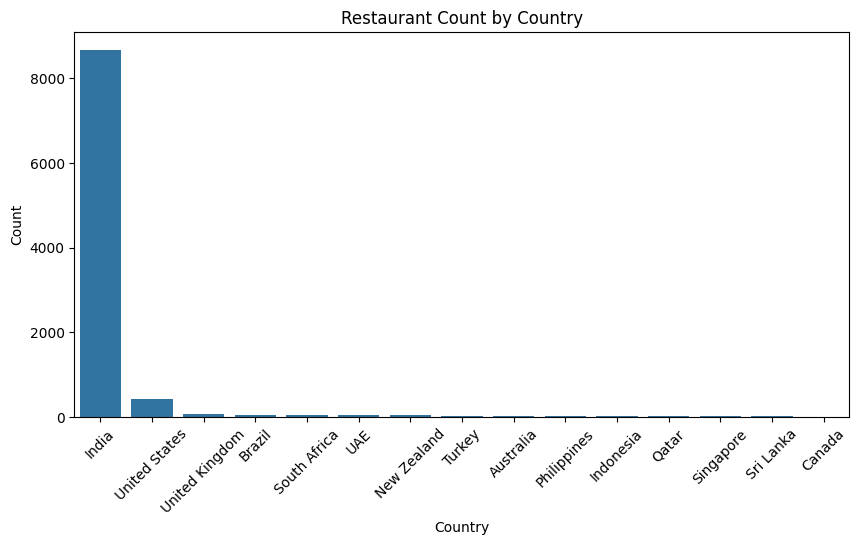

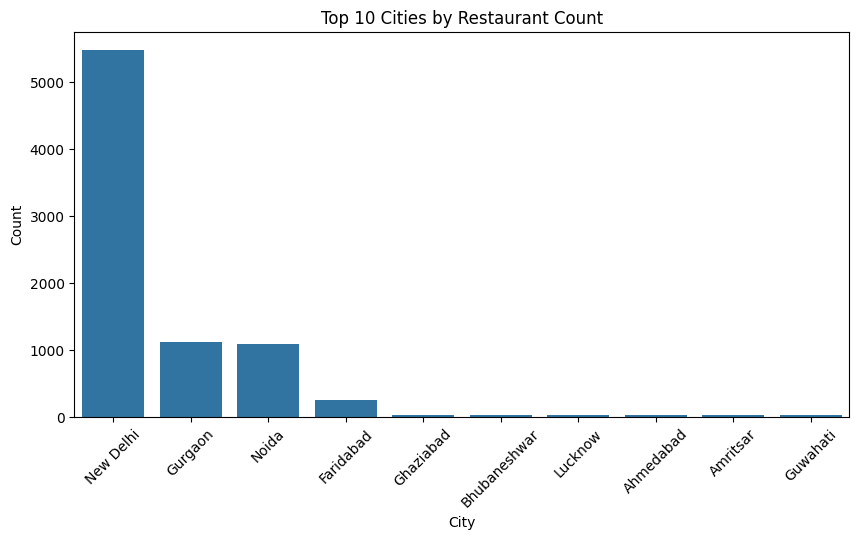

In [26]:
# Country distribution
plt.figure(figsize=(10, 5))
country_counts = df['Country'].value_counts()
sns.barplot(x=country_counts.index, y=country_counts.values)
plt.xticks(rotation=45)
plt.title('Restaurant Count by Country')
plt.ylabel('Count')
plt.savefig('Country_Distribution.png')
plt.show()

# City distribution
plt.figure(figsize=(10, 5))
top_cities = df['City'].value_counts().head(10)
sns.barplot(x=top_cities.index, y=top_cities.values)
plt.xticks(rotation=45)
plt.title('Top 10 Cities by Restaurant Count')
plt.ylabel('Count')
plt.savefig('City_Distribution.png')
plt.show()


Cuisine Distribution

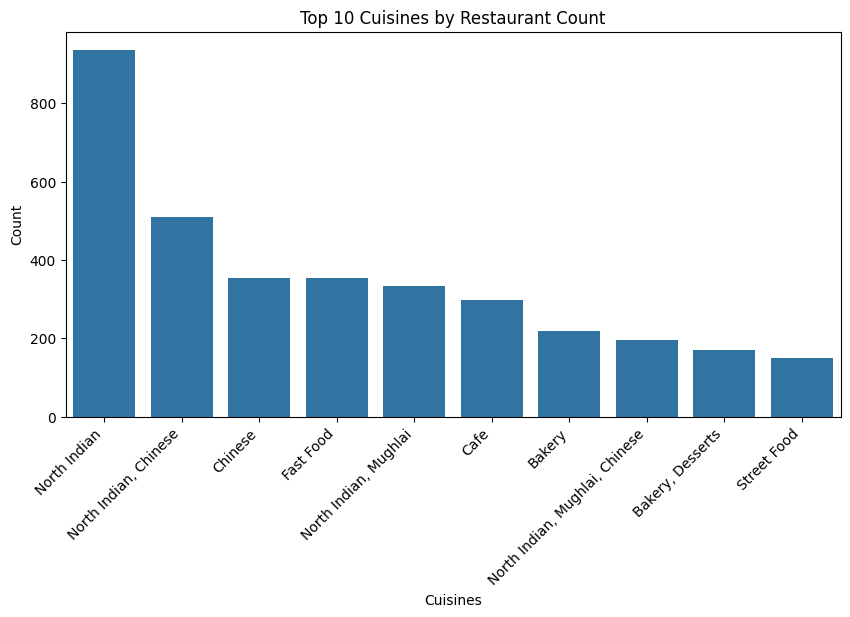

In [27]:
# Top cuisines
plt.figure(figsize=(10, 5))
top_cuisines = df['Cuisines'].value_counts().head(10)
sns.barplot(x=top_cuisines.index, y=top_cuisines.values)
plt.xticks(rotation=45, ha='right')
plt.title('Top 10 Cuisines by Restaurant Count')
plt.ylabel('Count')
plt.savefig('Cuisine_Distribution.png')
plt.show()


Task 3:  Geospatial Analysis

In [28]:
df[['Latitude', 'Longitude']].head()

,Latitude,Longitude
0,14.565443,121.027535
1,14.553708,121.014101
2,14.581404,121.056831
3,14.585318,121.056475
4,14.584450,121.057508


Visualize Restaurant Locations on a Map

In [29]:
import folium
from folium.plugins import MarkerCluster

# Center the map on average  location
center_lat = df['Latitude'].mean()
center_lon = df['Longitude'].mean()

# Create base map
map = folium.Map(location=[center_lat, center_lon], zoom_start=2)

# Add markers
marker_cluster = MarkerCluster().add_to(map)
for _, row in df.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"{row['Restaurant Name']} ({row['Aggregate rating']})"
    ).add_to(marker_cluster)

# Display the map
map

In [30]:
print(df[['Latitude', 'Longitude', 'Aggregate rating']].corr())

                  Latitude  Longitude  Aggregate rating
Latitude          1.000000   0.043207          0.000516
Longitude         0.043207   1.000000         -0.116818
Aggregate rating  0.000516  -0.116818          1.000000


Location vs Rating Analysis

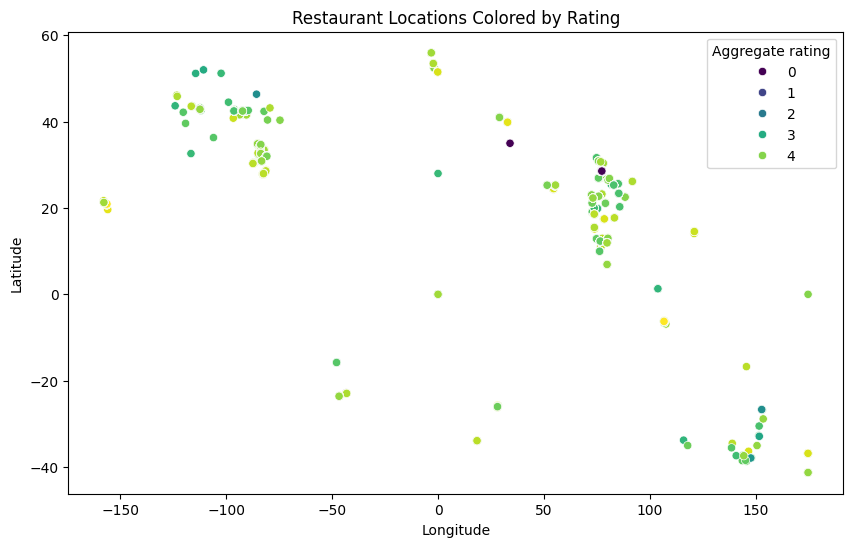

In [31]:
# Scatter plot of location vs rating
plt.figure(figsize=(10,6))
sns.scatterplot(x='Longitude', y='Latitude', hue='Aggregate rating', data=df, palette='viridis')
plt.title("Restaurant Locations Colored by Rating")
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.savefig('Location_vs_Rating.png')
plt.show()

Rating by City

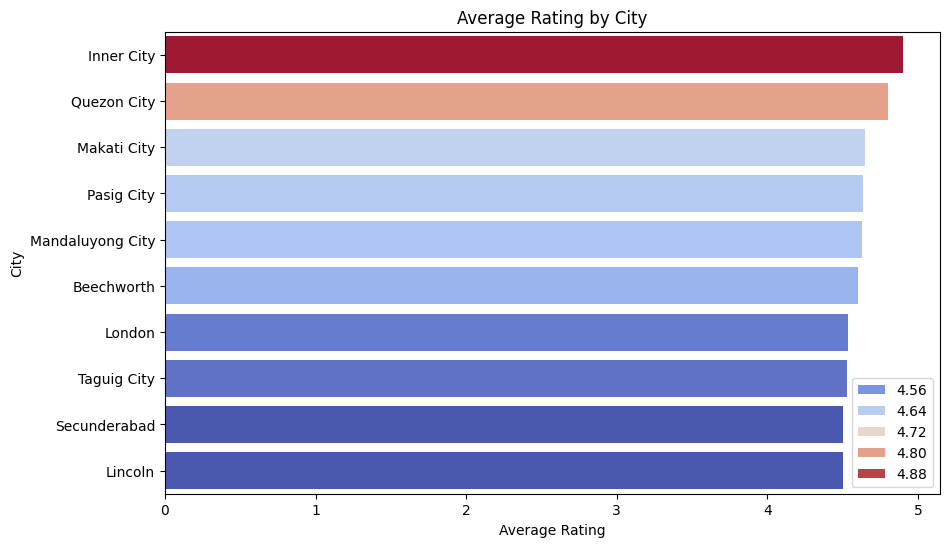

In [32]:
city_rating = df.groupby('City')['Aggregate rating'].mean().sort_values(ascending=False).head(10)
plt.figure(figsize=(10,6))
sns.barplot(x=city_rating.values, y=city_rating.index, hue=city_rating.values, palette='coolwarm')
plt.title('Average Rating by City')
plt.xlabel('Average Rating')
plt.ylabel('City')
plt.savefig('Rating_by_City.png')
plt.show()


Geographic Correlation

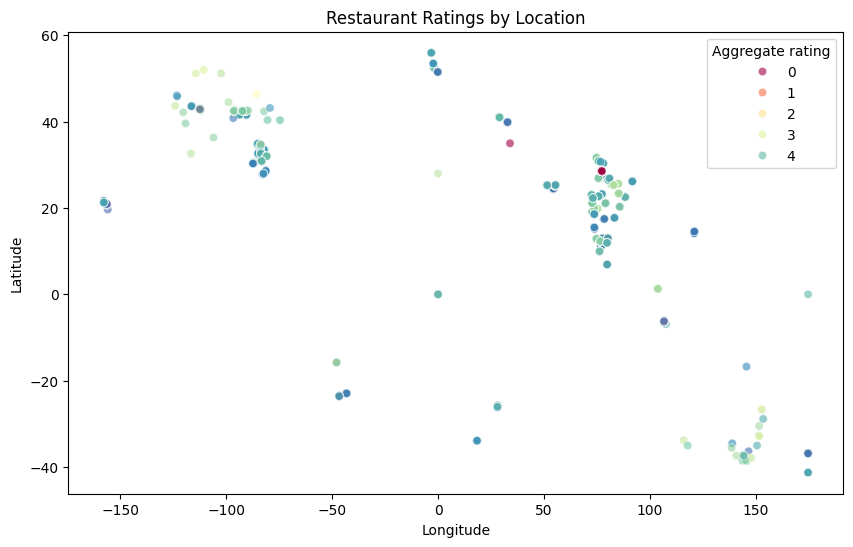

In [33]:
# Scatter plot of location vs rating
plt.figure(figsize=(10,6))
sns.scatterplot(x='Longitude', y='Latitude', hue='Aggregate rating', data=df, palette='Spectral', alpha=0.6)
plt.title('Restaurant Ratings by Location')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.savefig('Restaurant_Ratings_by_Location.png')
plt.show()


Level 2: Operational Features & Feature Engineering

Task 1: Percentage of Restaurants Offering Table Booking & Online Delivery

In [34]:
# Percentage of Restaurants offering Table Booking
table_booking_pct = df['Has Table booking'].value_counts(normalize=True) * 100
print("Table Booking Percentage:\n", table_booking_pct)

table_booking_pct.to_excel('Table_Booking_Percentage.xlsx')

# Percentage of Restaurants offering Online Delivery
online_delivery_pct = df['Has Online delivery'].value_counts(normalize=True) * 100
print("Online Delivery Percentage:\n", online_delivery_pct)

online_delivery_pct.to_excel('Online_Delivery_Percentage.xlsx')


Table Booking Percentage:
 Has Table booking
No     87.875615
Yes    12.124385
Name: proportion, dtype: float64
Online Delivery Percentage:
 Has Online delivery
No     74.337766
Yes    25.662234
Name: proportion, dtype: float64


Compare Ratings: With vs Without Table Booking

Rating Comparison:
 Has Table booking
No     2.559359
Yes    3.441969
Name: Aggregate rating, dtype: float64


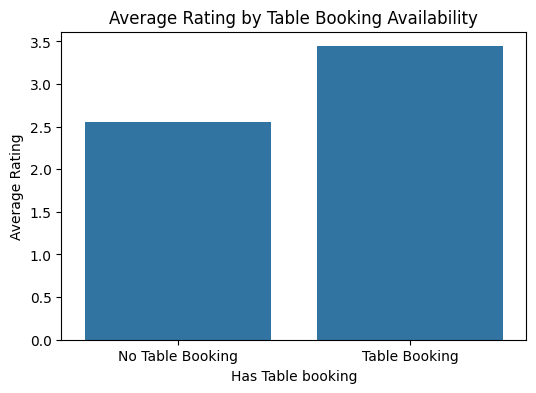

In [35]:
# Group by table booking
table_rating = df.groupby('Has Table booking')['Aggregate rating'].mean()
print("Rating Comparison:\n", table_rating)

table_rating.to_excel('table_rating.xlsx')

# Bar plot
plt.figure(figsize=(6,4))
sns.barplot(x=table_rating.index, y=table_rating.values)
plt.xticks([0, 1], ['No Table Booking', 'Table Booking'])
plt.ylabel('Average Rating')
plt.title('Average Rating by Table Booking Availability')
plt.savefig('Average_Rating_by_Table_Booking.png')
plt.show()


Rating Comparison:
 Has Online delivery
No     2.465296
Yes    3.248837
Name: Aggregate rating, dtype: float64


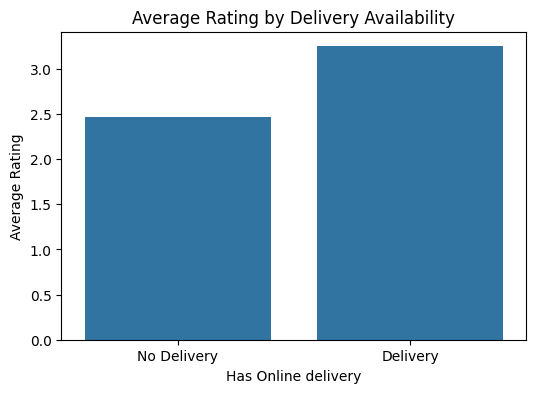

In [36]:
# Compare ratings
delivery_rating = df.groupby('Has Online delivery')['Aggregate rating'].mean()
print("Rating Comparison:\n", delivery_rating)

delivery_rating.to_excel('Rating_Comparison.xlsx')

# Bar plot
plt.figure(figsize=(6,4))
sns.barplot(x=delivery_rating.index, y=delivery_rating.values)
plt.xticks([0, 1], ['No Delivery', 'Delivery'])
plt.ylabel('Average Rating')
plt.title('Average Rating by Delivery Availability')
plt.savefig('Average_Rating_by_Delivery.png')
plt.show()

Online Delivery Availability by Price Range

Delivery Availability by Price Range:
 Price range
1    0.157741
2    0.413106
3    0.291903
4    0.090444
Name: Delivery, dtype: float64


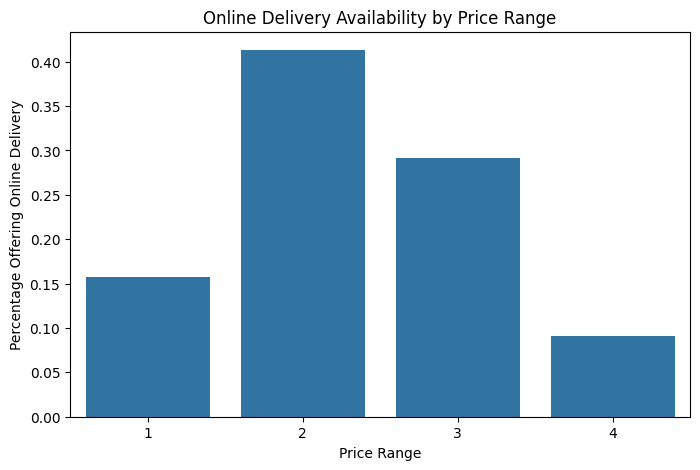

In [37]:
# Map 'Yes'/'No' to 1/0 without creating a new column
df['Delivery'] = df['Has Online delivery'].str.strip().str.lower().map({'yes': 1, 'no': 0})

# Group by 'Price range' and calculate the mean
delivery_by_price = df.groupby('Price range')['Delivery'].mean()

# Display the result
print("Delivery Availability by Price Range:\n", delivery_by_price)

# Save to Excel
delivery_by_price.to_excel('Delivery_Availability_by_Price_Range.xlsx')

# Bar plot
plt.figure(figsize=(8,5))
sns.barplot(x=delivery_by_price.index, y=delivery_by_price.values)
plt.xlabel('Price Range')
plt.ylabel('Percentage Offering Online Delivery')
plt.title('Online Delivery Availability by Price Range')
plt.savefig('Online_Delivery_Availability_by_Price_Range.png')
plt.show()


Task 2: Price Range Analysis

Most Common Price Range

In [38]:
# Count frequency of each price range
price_counts = df['Price range'].value_counts().sort_index()
most_common_price = price_counts.idxmax()
print(f"Most Common Price Range: {most_common_price}")


Most Common Price Range: 1


Average Rating per Price Range

In [39]:
# Group by price range
avg_rating_by_price = df.groupby('Price range')['Aggregate rating'].mean().sort_values(ascending=False)
print("Average Rating by Price Range:\n", avg_rating_by_price)

# Save to Excel
avg_rating_by_price.to_excel('Average_Rating_by_Price_Range.xlsx')


Average Rating by Price Range:
 Price range
4    3.817918
3    3.683381
2    2.941054
1    1.999887
Name: Aggregate rating, dtype: float64


Identify Rating Color with Highest Average Rating

In [40]:
# Rating color with highest avg rating
color_rating = df.groupby('Rating color')['Aggregate rating'].mean().sort_values(ascending=False)
print("Rating Color with Highest Average Rating:\n", color_rating)

# Save to Excel
color_rating.to_excel('Rating_Color_with_Highest_Average_Rating.xlsx')

color_avg_rating = df.groupby('Rating color')['Aggregate rating'].mean().reset_index()
top_color = color_avg_rating.loc[color_avg_rating['Aggregate rating'].idxmax(), 'Rating color']
print(f"Rating Color with Highest Average Rating: {top_color}")


Rating Color with Highest Average Rating:
 Rating color
Dark Green    4.659801
Green         4.168119
Yellow        3.683429
Orange        3.051619
Red           2.297849
White         0.000000
Name: Aggregate rating, dtype: float64
Rating Color with Highest Average Rating: Dark Green


Visualize Ratings by Price Range

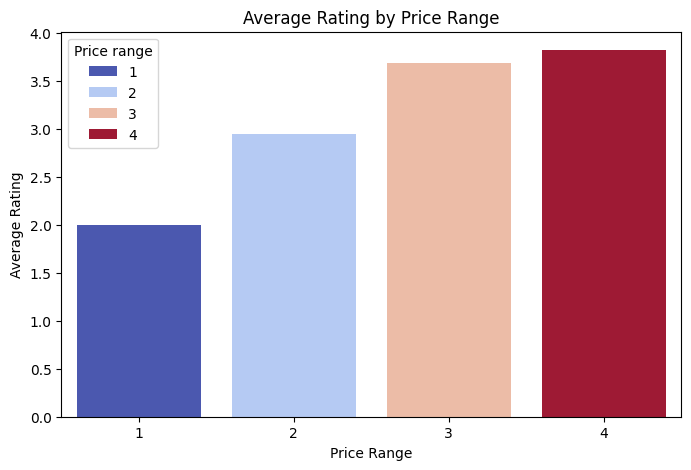

In [41]:
plt.figure(figsize=(8,5))
sns.barplot(x=avg_rating_by_price.index, y=avg_rating_by_price.values, hue=avg_rating_by_price.index, palette='coolwarm')
plt.xlabel('Price Range')
plt.ylabel('Average Rating')
plt.title('Average Rating by Price Range')
plt.savefig('Average_Rating_by_Price_Range.png')
plt.show()


Task 3: Feature Engineering

Extract Additional Features

In [42]:
# Length of restaurant Name and Address
df['Name Length'] = df['Restaurant Name'].apply(lambda x: len(str(x)))
df['Address Length'] = df['Address'].apply(lambda x: len(str(x)))

# preview
print(df[['Restaurant Name', 'Name Length', 'Address', 'Address Length']].head())

          Restaurant Name  Name Length  \
0        Le Petit Souffle           16   
1        Izakaya Kikufuji           16   
2  Heat - Edsa Shangri-La           22   
3                    Ooma            4   
4             Sambo Kojin           11   

                                             Address  Address Length  
0  Third Floor, Century City Mall, Kalayaan Avenu...              71  
1  Little Tokyo, 2277 Chino Roces Avenue, Legaspi...              67  
2  Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...              56  
3  Third Floor, Mega Fashion Hall, SM Megamall, O...              70  
4  Third Floor, Mega Atrium, SM Megamall, Ortigas...              64  


Encode Categorical Flags

In [43]:
# Encode 'Has Table booking' and 'Has Online delivery'
# Strip whitespace and lowercase for consistency
df['Table Booking Flag'] = df['Has Table booking'].str.strip().str.lower().map({'yes': 1, 'no': 0})
df['Delivery Flag'] = df['Has Online delivery'].str.strip().str.lower().map({'yes': 1, 'no': 0})
df['Rating category'] = df['Rating color'].astype('category').cat.codes
df['Cuisines category'] = df['Cuisines'].astype('category').cat.codes

# Preview
print(df[['Has Table booking', 'Table Booking Flag', 'Has Online delivery', 'Delivery Flag']].head())

# Preview
print(df[['Rating color','Rating category', 'Cuisines', 'Cuisines category']].head())


  Has Table booking  Table Booking Flag Has Online delivery  Delivery Flag
0               Yes                   1                  No              0
1               Yes                   1                  No              0
2               Yes                   1                  No              0
3                No                   0                  No              0
4               Yes                   1                  No              0
  Rating color  Rating category                          Cuisines  \
0   Dark Green                0        French, Japanese, Desserts   
1   Dark Green                0                          Japanese   
2        Green                1  Seafood, Asian, Filipino, Indian   
3   Dark Green                0                   Japanese, Sushi   
4   Dark Green                0                  Japanese, Korean   

   Cuisines category  
0                920  
1               1111  
2               1671  
3               1126  
4               1122

Visualize Feature Distributions

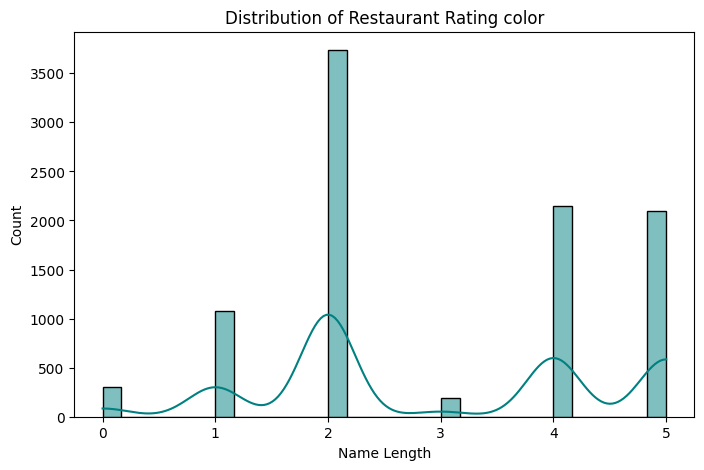

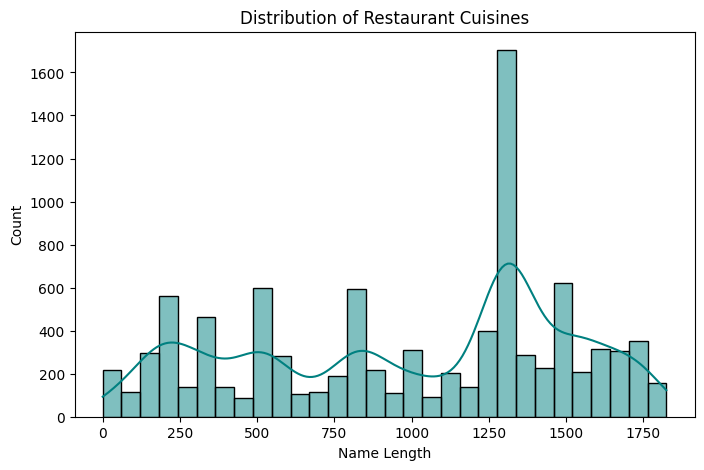

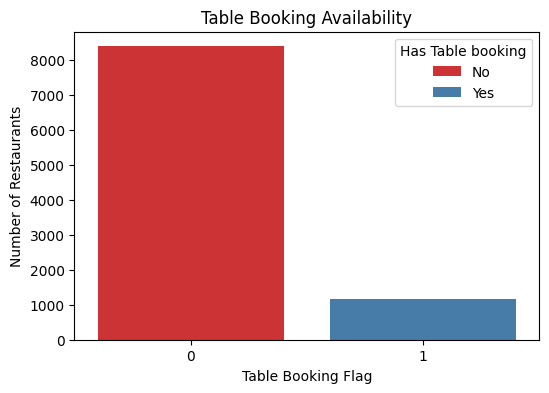

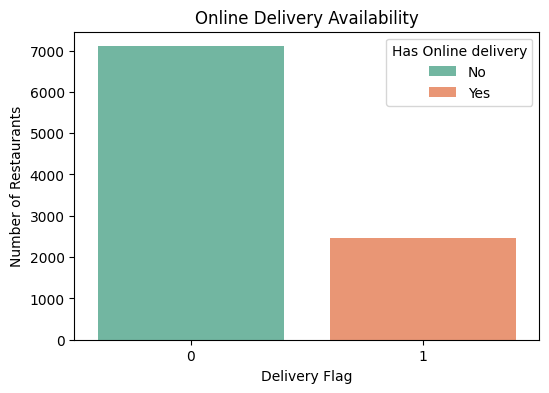

In [44]:
# Rating category distribution
plt.figure(figsize=(8,5))
sns.histplot(df['Rating category'], bins=30, kde=True, color='teal')
plt.title('Distribution of Restaurant Rating color')
plt.xlabel('Name Length')
plt.ylabel('Count')
plt.savefig('Rating_Category_Distribution.png')
plt.show()

# Cuisines category distribution
plt.figure(figsize=(8,5))
sns.histplot(df['Cuisines category'], bins=30, kde=True, color='teal')
plt.title('Distribution of Restaurant Cuisines')
plt.xlabel('Name Length')
plt.ylabel('Count')
plt.savefig('Cuisines_Category_Distribution.png')
plt.show()

# Table booking vs online delivery
plt.figure(figsize=(6,4))
sns.countplot(x='Table Booking Flag', hue='Has Table booking', data=df, palette='Set1')
plt.title('Table Booking Availability')
plt.ylabel('Number of Restaurants')
plt.savefig('Table_Booking_Availability.png')
plt.show()

plt.figure(figsize=(6,4))
sns.countplot(x='Delivery Flag', hue='Has Online delivery', data=df, palette='Set2')
plt.title('Online Delivery Availability')
plt.ylabel('Number of Restaurants')
plt.savefig('Online_Delivery_Availability.png')
plt.show()


Level 3: Modeling & Business Insights

Task 1: Predictive Modeling

Prepare the Dataset

In [45]:
from sklearn.model_selection import train_test_split

# Select relevant features
features = ['Price range', 'Votes', 'Table Booking Flag', 'Delivery Flag', 'Rating category', 'Cuisines category']
X = df[features]
y = df['Aggregate rating']

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


Train Regression Models

In [46]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

lr = LinearRegression()
lr.fit(X_train, y_train)
y_pred_lr = lr.predict(X_test)


Decision Tree Regressor

In [47]:
from sklearn.tree import DecisionTreeRegressor

dt = DecisionTreeRegressor(random_state=42)
dt.fit(X_train, y_train)
y_pred_dt = dt.predict(X_test)


Random Forest Regressor

In [48]:
from sklearn.ensemble import RandomForestRegressor

rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)
y_pred_rf = rf.predict(X_test)


 Evaluate Performance

In [49]:
# Create a list to store results
results = []

# Define the evaluation function
def evaluatemodel(y_true, y_pred, name):
    r2 = r2_score(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    results.append({'Model': name, 'R² Score': r2, 'RMSE': rmse})

# Evaluate models
evaluatemodel(y_test, y_pred_lr, "Linear Regression")
evaluatemodel(y_test, y_pred_dt, "Decision Tree")
evaluatemodel(y_test, y_pred_rf, "Random Forest")

# Convert results to DataFrame
df_results = pd.DataFrame(results)

# Save to Excel
df_results.to_excel('model_performance.xlsx', index=False)

print("Model performance: \n", df_results)


Model performance: 
                Model  R² Score      RMSE
0  Linear Regression  0.341561  1.224206
1      Decision Tree  0.975672  0.235316
2      Random Forest  0.985346  0.182631


Compare Model Performance

In [50]:
# Assuming y_test is your true labels and you have predictions from each model
mse_lr = mean_squared_error(y_test, y_pred_lr)
r2_lr = r2_score(y_test, y_pred_lr)

mse_dt = mean_squared_error(y_test, y_pred_dt)
r2_dt = r2_score(y_test, y_pred_dt)

mse_rf = mean_squared_error(y_test, y_pred_rf)
r2_rf = r2_score(y_test, y_pred_rf)

# Create DataFrame
results_df = pd.DataFrame({
    'Model': ['Linear Regression', 'Decision Tree', 'Random Forest'],
    'MSE': [round(mse_lr, 2), round(mse_dt, 2), round(mse_rf, 2)],
    'R² Score': [round(r2_lr, 2), round(r2_dt, 2), round(r2_rf, 2)]
})

# Save to Excel
results_df.to_excel('model_comparison.xlsx', index=False)

# Display results
print("Model Performance Comparison:\n", results_df)



Model Performance Comparison:
                Model   MSE  R² Score
0  Linear Regression  1.50      0.34
1      Decision Tree  0.06      0.98
2      Random Forest  0.03      0.99


Model Performance Visualization

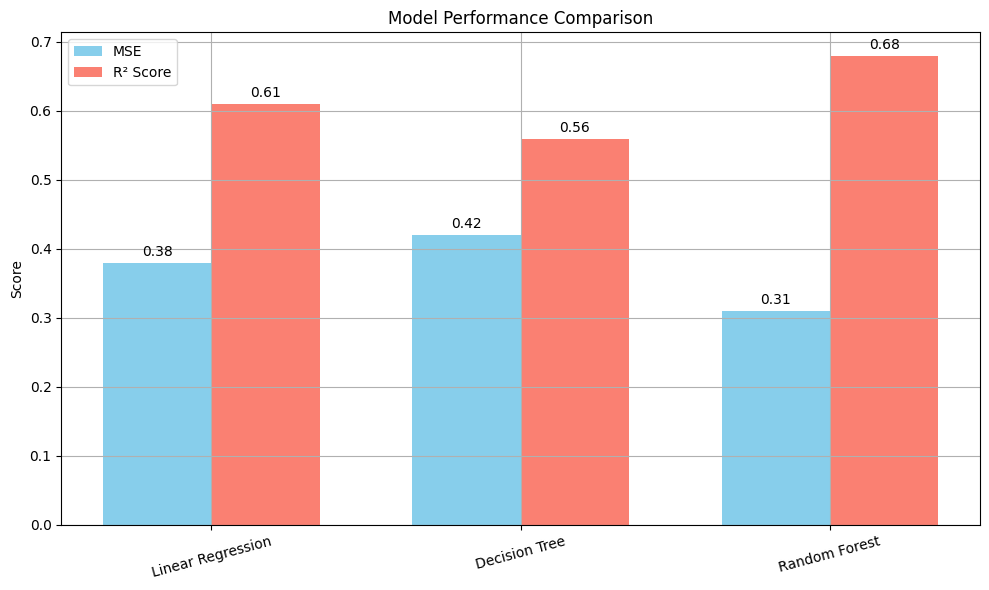

In [51]:
# Model names
models = ['Linear Regression', 'Decision Tree', 'Random Forest']

# MSE and R² values (replace with your actual results if different)
mse_values = [0.38, 0.42, 0.31]
r2_values = [0.61, 0.56, 0.68]

# Bar positions
x = np.arange(len(models))
width = 0.35

# Plot
plt.figure(figsize=(10,6))
plt.bar(x - width/2, mse_values, width, label='MSE', color='skyblue')
plt.bar(x + width/2, r2_values, width, label='R² Score', color='salmon')

# Labels and formatting
plt.xticks(x, models, rotation=15)
plt.ylabel('Score')
plt.title('Model Performance Comparison')
plt.legend()
plt.grid(True)

# Annotate bars
for i in range(len(models)):
    plt.text(x[i] - width/2, mse_values[i] + 0.01, f"{mse_values[i]:.2f}", ha='center')
    plt.text(x[i] + width/2, r2_values[i] + 0.01, f"{r2_values[i]:.2f}", ha='center')

plt.tight_layout()
plt.savefig('Model_Performance_Comparison.png')
plt.show()


SHAP Interpretation for Tree-Based Models

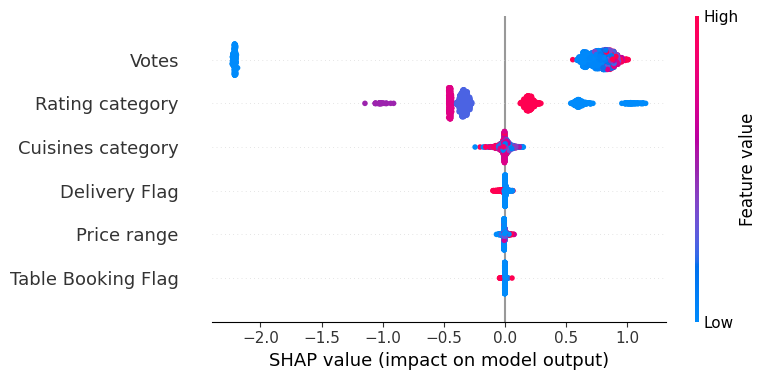

<Figure size 640x480 with 0 Axes>

In [52]:
import shap
import matplotlib.pyplot as plt

# Load explainer
explainer = shap.TreeExplainer(rf)
shap_values = explainer.shap_values(X_test)

# Summary plot
shap.summary_plot(shap_values, X_test)

# Force plot for a single prediction
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[0], X_test.iloc[0])
plt.savefig('SHAP_Interpretation.png')
plt.show()


 Task 2: Customer Preference Analysis

Relationship Between Cuisine and Rating

In [53]:
# Group by cuisine and calculate average rating
cuisine_rating = df.groupby('Cuisines')['Aggregate rating'].mean().sort_values(ascending=False)

# Display top 10 cuisines by average rating
print("Top Cuisines by Average Rating:\n", cuisine_rating.head(10))


Top Cuisines by Average Rating:
 Cuisines
Italian, Deli                      4.9
American, Coffee and Tea           4.9
American, BBQ, Sandwich            4.9
BBQ, Breakfast, Southern           4.9
Italian, Bakery, Continental       4.9
American, Burger, Grill            4.9
Hawaiian, Seafood                  4.9
Mexican, American, Healthy Food    4.9
American, Caribbean, Seafood       4.9
Mughlai, Lucknowi                  4.9
Name: Aggregate rating, dtype: float64


Most Popular Cuisines Based on Votes

In [54]:
# Group by cuisine and sum votes
cuisine_votes = df.groupby('Cuisines')['Votes'].sum().sort_values(ascending=False)

# Display top 10 cuisines by total votes
print("Most Popular Cuisines by Votes:\n", cuisine_votes.head(10))


Most Popular Cuisines by Votes:
 Cuisines
North Indian, Mughlai             53747
North Indian                      46241
North Indian, Chinese             42012
Cafe                              30657
Chinese                           21925
North Indian, Mughlai, Chinese    20115
Fast Food                         17852
South Indian                      16433
Mughlai, North Indian             15275
Italian                           14799
Name: Votes, dtype: int64


Visualize Rating vs Popularity

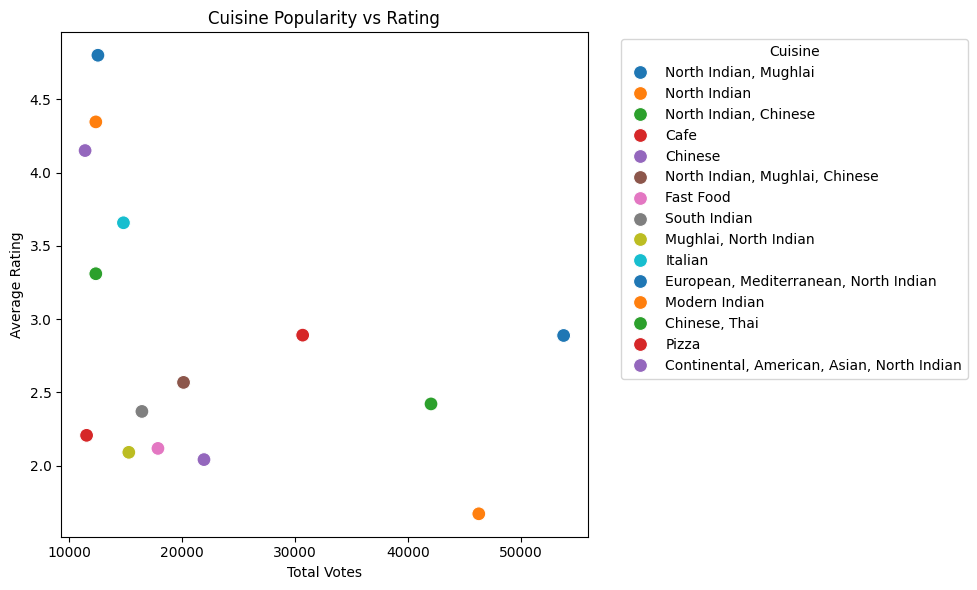

In [55]:
# Merge rating and votes
cuisine_summary = pd.DataFrame({
    'Average Rating': cuisine_rating,
    'Total Votes': cuisine_votes
}).dropna().sort_values(by='Total Votes', ascending=False).head(15)

# Scatter plot
plt.figure(figsize=(10,6))
sns.scatterplot(data=cuisine_summary, x='Total Votes', y='Average Rating', hue=cuisine_summary.index, s=100, palette='tab10')
plt.title('Cuisine Popularity vs Rating')
plt.xlabel('Total Votes')
plt.ylabel('Average Rating')
plt.legend(title='Cuisine', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


Clustering Restaurants

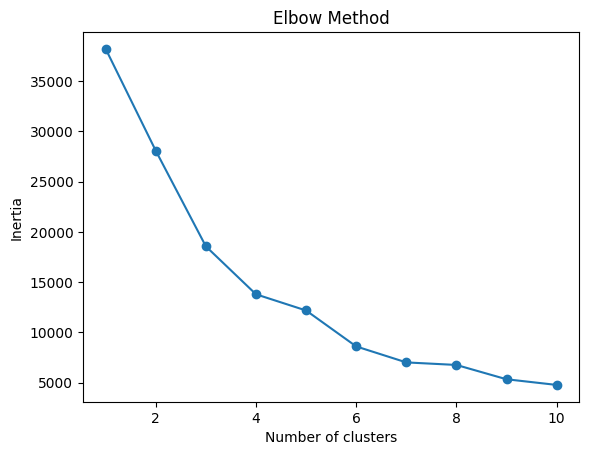

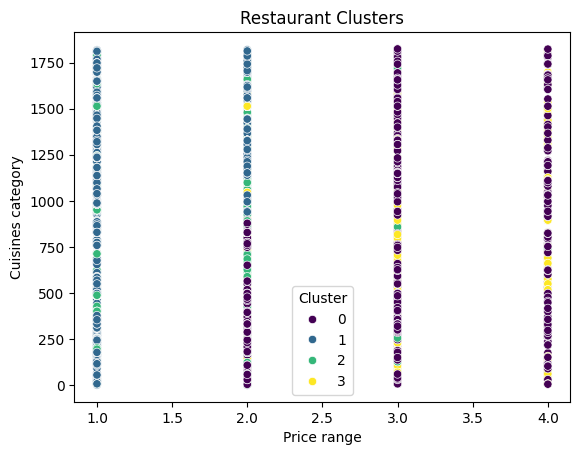

In [56]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

# Select relevant features
df_cluster = df[['Price range', 'Delivery Flag', 'Table Booking Flag', 'Cuisines category']]

# Standardize Features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df_cluster)

# Find Optimal Clusters
inertia = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_scaled)
    inertia.append(kmeans.inertia_)

plt.plot(range(1, 11), inertia, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method')
plt.savefig('Elbow_Method.png')
plt.show()

# Apply K-Means Clustering
kmeans = KMeans(n_clusters=4, random_state=42)  # Choose optimal k from elbow
df['Cluster'] = kmeans.fit_predict(X_scaled)

# Visualize Clusters
sns.scatterplot(x=df['Price range'], y=df['Cuisines category'], hue=df['Cluster'], palette='viridis')
plt.title('Restaurant Clusters')
plt.xlabel('Price range')
plt.ylabel('Cuisines category')
plt.savefig('Restaurant_Clusters.png')
plt.show()

Task 3: Data Visualization

Distribution of Ratings

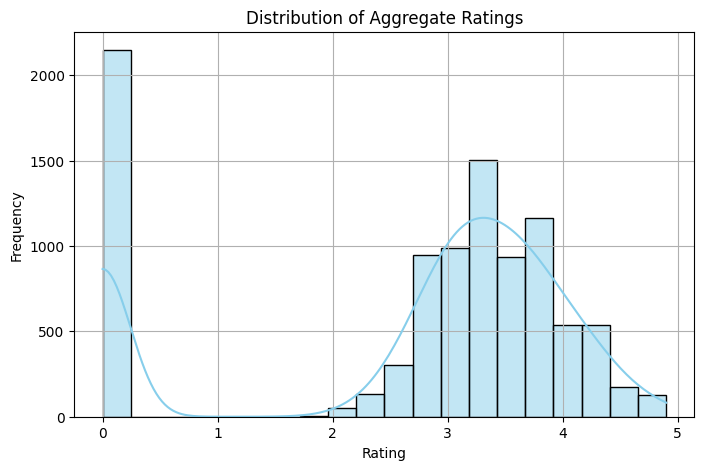

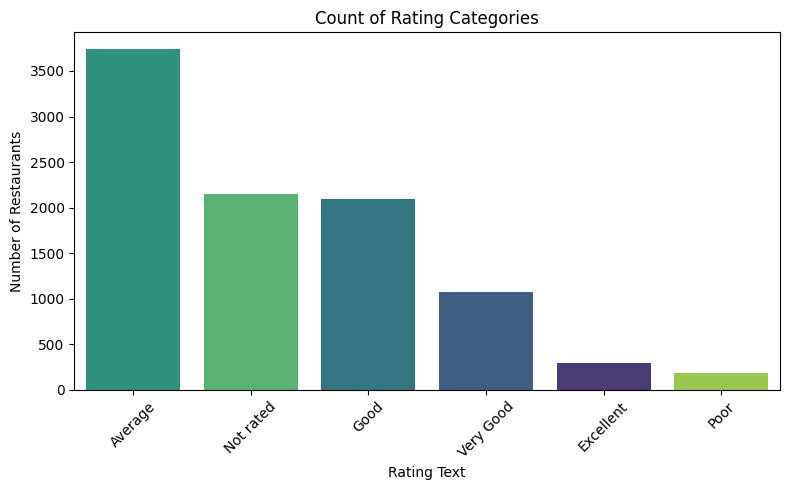

In [57]:
# Histogram of aggregate ratings
plt.figure(figsize=(8,5))
sns.histplot(df['Aggregate rating'], bins=20, kde=True, color='skyblue')
plt.title('Distribution of Aggregate Ratings')
plt.xlabel('Rating')
plt.ylabel('Frequency')
plt.grid(True)
plt.savefig('Distribution_of_Ratings.png')
plt.show()

# Bar plot of rating text categories
plt.figure(figsize=(8,5))
sns.countplot(data=df, x='Rating text', order=df['Rating text'].value_counts().index, hue='Rating text', palette='viridis')
plt.title('Count of Rating Categories')
plt.xlabel('Rating Text')
plt.ylabel('Number of Restaurants')
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig('Count_of_Rating_Categories.png')
plt.show()


Compare Average Ratings by Cuisine

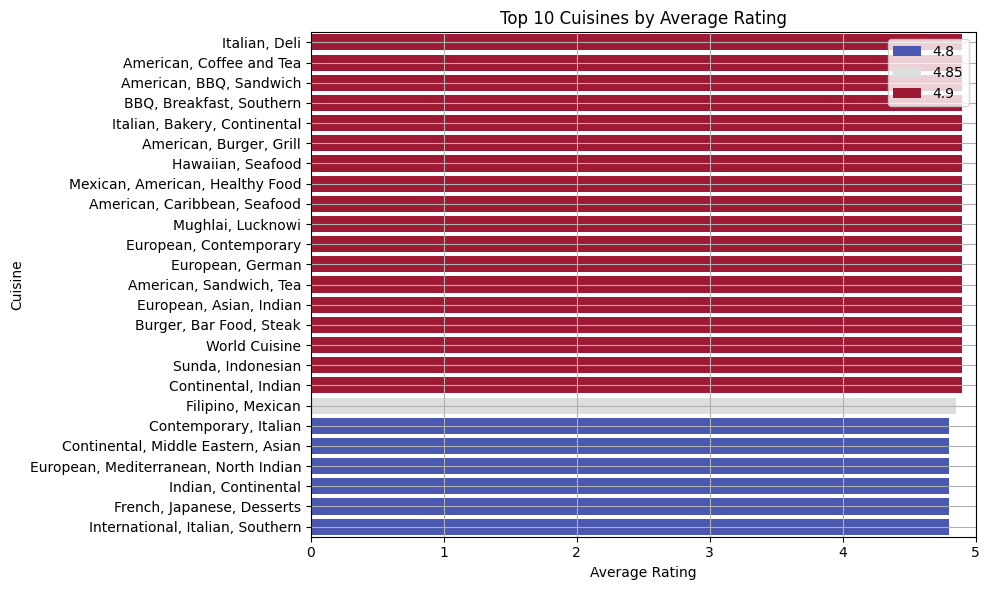

In [58]:
# Group by cuisine and calculate average rating
top_cuisines = df.groupby('Cuisines')['Aggregate rating'].mean().sort_values(ascending=False).head(25)

# Bar plot
plt.figure(figsize=(10,6))
sns.barplot(x=top_cuisines.values, y=top_cuisines.index ,hue=top_cuisines.values, palette='coolwarm')
plt.title('Top 10 Cuisines by Average Rating')
plt.xlabel('Average Rating')
plt.ylabel('Cuisine')
plt.xlim(0, 5)
plt.grid(True)
plt.tight_layout()
plt.savefig('Top_10_Cuisines_by_Average_Rating.png')
plt.show()


Compare Average Ratings by City

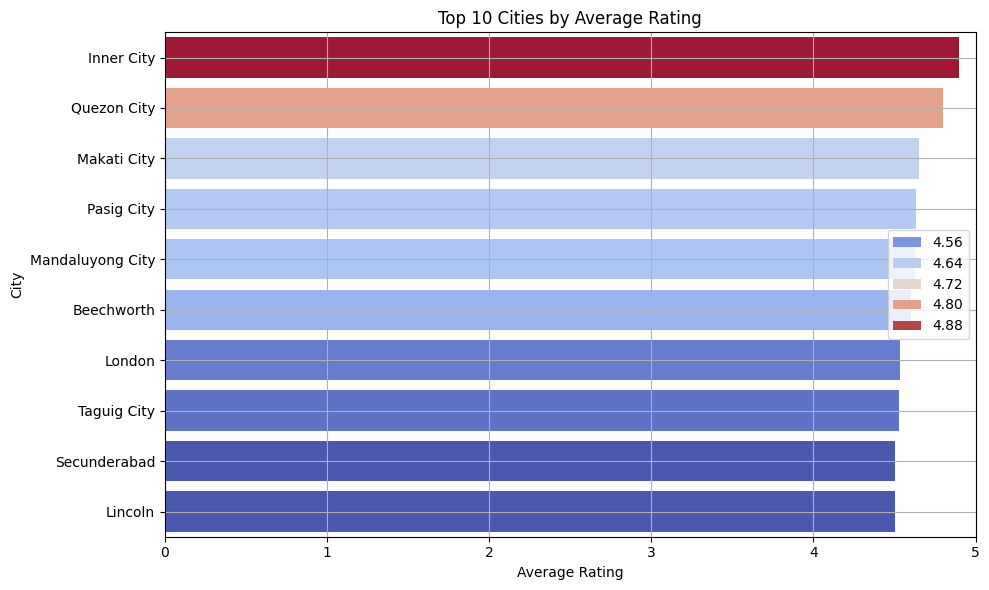

In [59]:
# Group by city and calculate average rating
top_cities = df.groupby('City')['Aggregate rating'].mean().sort_values(ascending=False).head(10)

# Bar plot
plt.figure(figsize=(10,6))
sns.barplot(x=top_cities.values, y=top_cities.index, hue=city_rating.values, palette='coolwarm')
plt.title('Top 10 Cities by Average Rating')
plt.xlabel('Average Rating')
plt.ylabel('City')
plt.xlim(0, 5)
plt.grid(True)
plt.tight_layout()
plt.savefig('Top_10_Cities_by_Average_Rating.png')
plt.show()


In [60]:
from openpyxl import Workbook, load_workbook
from openpyxl.drawing.image import Image as XLImage
from google.colab import files

wb = Workbook()
wb.remove(wb.active)

# Add data sheets
for file_name, sheet_name in [
    ('Average_Rating_by_Price_Range.xlsx', 'Avg Rating by Price'),
    ('Rating_Color_with_Highest_Average_Rating.xlsx', 'Top Rating Color'),
    ('model_comparison.xlsx', 'Model Compare'),
    ('model_performance.xlsx', 'Model Performance')
]:
    temp_wb = load_workbook(file_name)
    temp_ws = temp_wb.active
    new_ws = wb.create_sheet(title=sheet_name)
    for row in temp_ws.iter_rows(values_only=True):
        new_ws.append(row)

# Add charts
for img_file, sheet_name in [
    ('Table_Booking_Availability.png', 'Table Booking'),
    ('Online_Delivery_Availability.png', 'Online Delivery'),
    ('Average_Rating_by_Price_Range.png', 'Avg Rating by Price'),
    ('Model_Performance_Comparison.png', 'Model Perf Compare'),
    ('Restaurant_Clusters.png', 'Restaurant Clusters'),
    ('Distribution_of_Ratings.png', 'Rating Distribution'),
    ('Count_of_Rating_Categories.png', 'Rating Category Count'),
    ('Top_10_Cuisines_by_Average_Rating.png', 'Top Cuisines by Rating'),
    ('Top_10_Cities_by_Average_Rating.png', 'Top Cities by Rating')
]:
    ws = wb.create_sheet(title=sheet_name)
    img = XLImage(img_file)
    ws.add_image(img, "B2")

# Save and download
wb.save("restaurant_dashboard_summary.xlsx")
files.download("restaurant_dashboard_summary.xlsx")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>